<a href="https://colab.research.google.com/github/datasith/ds-experiments-yolov5/blob/main/demo_sku110k.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Training YOLOv5 on the SKU110K dataset

In this notebook I provide demo on how to train a `YOLOv5` model on a custom dataset from **Kagle**. In particular, I use the SKU110K dataset, which consists of densely pack images of grocery products on shelves.

As the SKU110K dataset doesn't contain any classification labels (all the bounding boxes correspond to a single class, `object`) we use it to train a model able to detect the location of objects in the image without expecting it to tell us what the object class is.

The notebook will run both locally as well as in Google Colab, and all the steps needed for either platform are provided.

---
**Author:** Cisco Zabala ([@datasith](https://twitter.com/datasith) | [LinkedIn](https://www.linkedin.com/in/datasith/) | [Kaggle](https://kaggle.com/thedatasith) | [GitHub](https://github.com/datasith))

## Include Requirements

In [ ]:
import os
import torch
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} " \
      f"({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla V100-SXM2-16GB)


## Prepare the SKU110K Dataset

We need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

For the SKU110K dataset, the preparation and formating are explained in detail in the notebook `convert_yolov5.ipynb` inside [SKU110K repository on GitHub](https://github.com/datasith/ds-datasets-sku110k). For this notebook, we can simply download the data alread fornmetted from [Kaggle](https://kaggle.com).

To use the Kaggle API, sign up for a Kaggle account at https://www.kaggle.com. Then go to the 'Account' tab of your user profile (`https://www.kaggle.com/<username>/account`) and select 'Create API Token'. This will trigger the download of `kaggle.json`, a file containing your API credentials. Place this file in the location `~/.kaggle/kaggle.json`

For protection, remember to modify read-write access to the file:

```chmod 600 ~/.kaggle/kaggle.json```


In [ ]:
# In case the Kaggle CLI isn't installed already

# !pip install -q kaggle

In [ ]:
# Replace the values to match your username and API key if you haven't added the file already

!mkdir -p ~/.kaggle
!echo "{\"username\":\"YOUR_USERNAME\",\"key\":\"YOUR_API_KEY\"}" >> ~/.kaggle/kaggle.json && chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# Specify the location of the dataset for the CLI
# thedatasith/sku110k-annotations

DATASET_OWNER = "thedatasith"
DATASET_DIR   = "datasets"
DATASET_NAME  = "sku110k-annotations"
!mkdir -p "$DATASET_DIR"
!kaggle datasets download "$DATASET_OWNER"/"$DATASET_NAME" -p "$DATASET_DIR"
!unzip -o "$DATASET_DIR"/"$DATASET_NAME".zip -d "$DATASET_DIR" > /dev/null
!rm "$DATASET_DIR"/"$DATASET_NAME".zip

100% 13.1G/13.2G [02:05<00:00, 130MB/s]
100% 13.2G/13.2G [02:06<00:00, 112MB/s]


The last step in configuring the dataset for using with the YOLOv5 model is specifying in a YAML file our configuration parameters. For the SKU110K dataset, we need:

In [ ]:
%%bash
echo "# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: /content/datasets/SKU110K_fixed/images  # dataset root dir
train: train  # train images (relative to 'path')  8219 images
val: val  # val images (relative to 'path')  588 images
test: test  # test images (optional)  2936 images

# Classes
nc: 1  # number of classes
names: ['object']  # class names
" > datasets/data_colab.yaml

## Fetch the YOLOv5 repository

If you're working locally, this simply requires the command:

``` 
git submodule init
git submodule update
```

However, if you're running on Colab, you'll need to run the following line:
```
git clone https://github.com/ultralytics/yolov5
```

Below is a snipped that will make this check automatically. You can always modify it to match your own environment.

In [ ]:
import sys
IN_COLAB = 'google.colab' in sys.modules
if IN_COLAB == True:
    !git clone https://github.com/ultralytics/yolov5
else:
    !git submodule init
    !git submodule update

Cloning into 'yolov5'...
remote: Enumerating objects: 12192, done.
remote: Total 12192 (delta 0), reused 0 (delta 0), pack-reused 12192
Receiving objects: 100% (12192/12192), 11.96 MiB | 27.91 MiB/s, done.
Resolving deltas: 100% (8441/8441), done.


## Install the YOLOv5 requirements

In [ ]:
!pip install -U pip && pip install -q -r yolov5/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 596.3/596.3 kB 21.5 MB/s eta 0:00:00


## Train a custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** our dataset location
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
# Create a time-based filename for our training output directory

import time
RUN_NAME = time.strftime("%Y%m%d-%H%M%S")
RUN_NAME

'20220608-210336'

### [Optional] Visualize training progress on Weights & Biases

For visualizing the training progress, we'll use the popular `wandb` ([Weights & Biases](https://wandb.ai/fully-connected)) platform and utility:

In [ ]:
# NB: the latest version contains a bug that conflicts with YOLOv5, so using an 
# older version for now
# https://github.com/wandb/client/issues/3319
!pip install -q wandb==0.12.9

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 40.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.4/97.4 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


After installing `wandb` we need to authorize access. This can be done automatically using the code below.

In [ ]:
import wandb
wandb.login(relogin=True)

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

If the `wandb.login()` fails, we can copy the API key from:

* https://wandb.ai/authorize

And place it in a local file `/root/.netrc` with the contents:

```bash
machine api.wandb.ai
  login user
  password YOUR_API_KEY
```

*Note that only the `YOUR_API_KEY` value (not `user`) should be changed.*

In [ ]:
%%bash -s "$RUN_NAME"

# NOTES:
# for quiet output set the environment variable YOLOv5_VERBOSE to False
# some hyperparameter tuning can be achieved using flags like --optimizer 
# for using custom weights (here we use pretrained ones) change --weights 

export YOLOv5_VERBOSE=False

python ./yolov5/train.py \
   --exist-ok \
   --img 416 \
   --batch 32 \
   --epochs 100 \
   --data ./datasets/data_colab.yaml \
   --weights weights/yolov5s.pt \
   --single-cls \
   --cache \
   --project yolov5-wandb-demo \
   --name $1 \
   --upload_dataset \
   --bbox_interval 10 \
   --save-period 10

Process is terminated.


## Evaluate custom YOLOv5 model performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5`. Learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%reload_ext tensorboard
%tensorboard --logdir yolov5-wandb-demo/exp/

<IPython.core.display.Javascript object>

# Visualize the model's performance

To see our trained model in action, let's run the inference script and visualize the Object Detection predictions on test images.

In [ ]:
%%bash -s "$RUN_NAME"

export YOLOv5_VERBOSE=False

python yolov5/detect.py \
   --exist-ok \
   --weights yolov5-wandb-demo/exp/weights/best.pt \
   --img 416 \
   --conf-thres 0.1 \
   --source datasets/SKU110K_fixed/images/test \
   --project yolov5-wandb-demo/detect \
#    --name $1

Process is terminated.


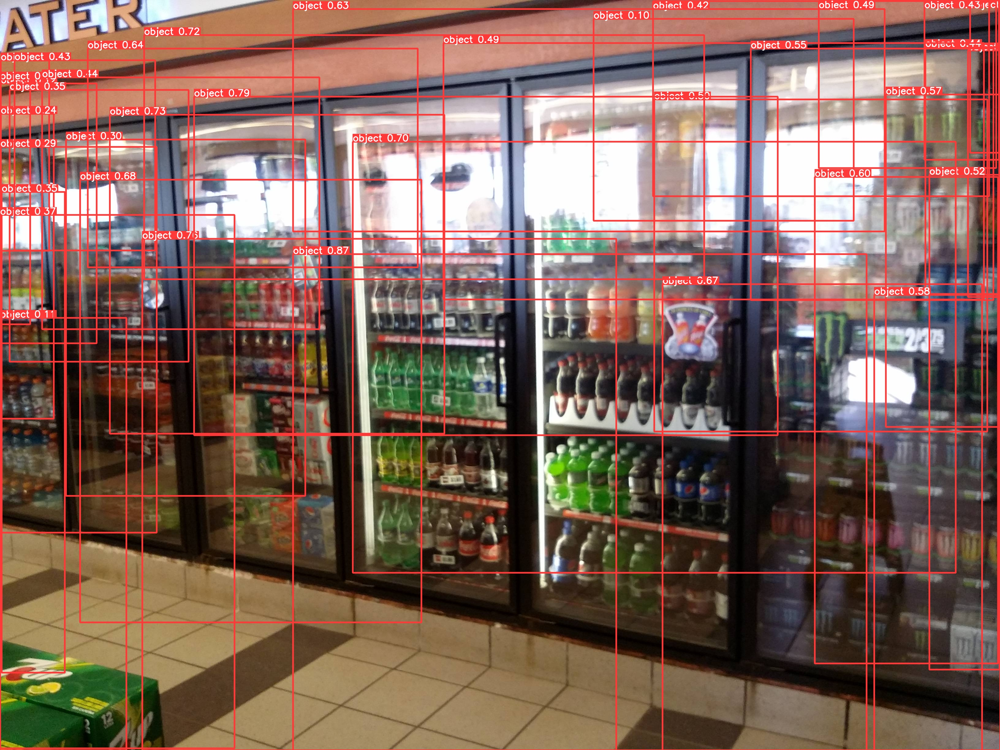

In [ ]:
# Display inference on a random test image
# Run multiple times, for seeing different results

import glob
import random
from IPython.display import Image, display

images = glob.glob(f'yolov5-wandb-demo/detect/exp/*.jpg')
idx = random.randint(0, 20)#len(images))
display(Image(filename=images[idx], width = 600))

## Conclusion and next steps

This notebook shows all the necessary steps to train a YOLOv5 model in a custom dataset, which allows it to detect specific objects using one class. To improve the model's performance, it's recommended to first interate on dataset coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy a model to an application, see this guide on [exporting a model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once a model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).